# Milestore 3

## Tasks:
- relationship analysis
    - identify relationship between variables to understand more about the data

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

import os

In [2]:
import warnings
warnings.filterwarnings(action="ignore")

In [3]:
pd.set_option('display.max_columns', None)

In [4]:
# dir path
DATA_DIR = '../data/'
RESULT_DIR = '../results/'

#### Read the dataset

In [5]:
# read dataset using pandas
raw_data = pd.read_csv(os.path.join(DATA_DIR, "Food_Inspections.csv"), parse_dates=True)

In [6]:
raw_data.head(5)

,Inspection ID,DBA Name,AKA Name,License #,Facility Type,Risk,Address,City,State,Zip,Inspection Date,Inspection Type,Results,Violations,Latitude,Longitude,Location
0,2571417,"M K POULTRY, INC.","M K POULTRY, INC.",1959029.0,Grocery Store,Risk 2 (Medium),2600 W 51ST ST,CHICAGO,IL,60632.0,02/17/2023,Complaint,Fail,"1. PERSON IN CHARGE PRESENT, DEMONSTRATES KNOW...",41.801181,-87.689185,"(41.801181282541556, -87.68918531154972)"
1,2571362,FIRST ACADEMY,FIRST ACADEMY,2501698.0,Children's Services Facility,Risk 1 (High),2523-2525 W PETERSON AVE,CHICAGO,IL,60659.0,02/16/2023,License,Pass,NaN,41.990367,-87.693163,"(41.99036720731882, -87.6931633926933)"
2,2571314,Northwest Middle/Belmont-Cragin,Northwest Middle School,41121.0,School,Risk 1 (High),5252 W Palmer,CHICAGO,IL,60639.0,02/16/2023,Canvass,Pass,NaN,41.920538,-87.758200,"(41.920538446762095, -87.75820002999474)"
3,2571261,SALT SHED,SALT SHED,2877078.0,MUSIC VENUE,Risk 3 (Low),1357 N ELSTON AVE,CHICAGO,IL,60642.0,02/15/2023,License Re-Inspection,Pass,"38. INSECTS, RODENTS, & ANIMALS NOT PRESENT - ...",41.907049,-87.659765,"(41.90704947171354, -87.6597649708448)"
4,2571260,M & A BAKERY,M BAKERY,1382540.0,Bakery,Risk 1 (High),1527 W LAWRENCE AVE,CHICAGO,IL,60640.0,02/15/2023,Canvass,Out of Business,NaN,41.968773,-87.668624,"(41.96877279428135, -87.6686244081723)"


In [7]:
raw_data.tail()

,Inspection ID,DBA Name,AKA Name,License #,Facility Type,Risk,Address,City,State,Zip,Inspection Date,Inspection Type,Results,Violations,Latitude,Longitude,Location
249636,120371,FALCOZ GROUP,AL'S RED HOTS,1645128.0,Restaurant,Risk 2 (Medium),2908 W LAKE ST,CHICAGO,IL,60612.0,03/05/2010,Complaint,Fail,18. NO EVIDENCE OF RODENT OR INSECT OUTER OPEN...,41.884248,-87.699266,"(41.88424820966617, -87.69926640072916)"
249637,160277,STARBUCKS COFFEE #2412,STARBUCKS COFFEE #2412,23132.0,Restaurant,Risk 2 (Medium),1229 N CLYBOURN AVE,CHICAGO,IL,60610.0,02/24/2010,Canvass,Pass,32. FOOD AND NON-FOOD CONTACT SURFACES PROPERL...,41.904473,-87.640334,"(41.90447254385478, -87.64033362435434)"
249638,67924,FRANK FOOD #4,FRANK FOOD #4,1767467.0,Grocery Store,Risk 3 (Low),1819 S KEDZIE AVE,CHICAGO,IL,60623.0,01/19/2010,Complaint,Fail,18. NO EVIDENCE OF RODENT OR INSECT OUTER OPEN...,41.857141,-87.705261,"(41.85714095488576, -87.70526116851221)"
249639,88296,SWIFT ELEMENTARY SCHOOL,SWIFT ELEMENTARY SCHOOL,25571.0,School,Risk 1 (High),5900 N Winthrop AVE,CHICAGO,IL,60660.0,03/16/2010,Canvass,Pass,"34. FLOORS: CONSTRUCTED PER CODE, CLEANED, GOO...",41.989157,-87.658333,"(41.98915734238827, -87.65833342161731)"
249640,68148,MORRILL,MORRILL,24571.0,School,Risk 1 (High),6011 S Rockwell (2600W) AVE,CHICAGO,IL,60629.0,02/04/2010,Canvass,Pass,32. FOOD AND NON-FOOD CONTACT SURFACES PROPERL...,NaN,NaN,NaN


In [8]:
raw_data.columns

Index(['Inspection ID', 'DBA Name', 'AKA Name', 'License #', 'Facility Type',
       'Risk', 'Address', 'City', 'State', 'Zip', 'Inspection Date',
       'Inspection Type', 'Results', 'Violations', 'Latitude', 'Longitude',
       'Location'],
      dtype='object')

In [9]:
raw_data.columns = [column_name.replace(' ', '_').lower() for column_name in raw_data.columns]

In [10]:
raw_data.dtypes

inspection_id        int64
dba_name            object
aka_name            object
license_#          float64
facility_type       object
risk                object
address             object
city                object
state               object
zip                float64
inspection_date     object
inspection_type     object
results             object
violations          object
latitude           float64
longitude          float64
location            object
dtype: object

In [11]:
raw_data['inspection_date'] = pd.to_datetime(raw_data.inspection_date)

In [12]:
raw_data.inspection_date.sample(3)

238215   2010-12-08
203390   2012-12-26
207016   2012-08-06
Name: inspection_date, dtype: datetime64[ns]

In [13]:
food_fltrd = raw_data.copy()

In [14]:
food_fltrd.inspection_date.min(), food_fltrd.inspection_date.max()

(Timestamp('2010-01-04 00:00:00'), Timestamp('2023-02-17 00:00:00'))

In [15]:
food_fltrd.shape

(249641, 17)

#### Exploratory analysis

In [16]:
food_fltrd.head()

,inspection_id,dba_name,aka_name,license_#,facility_type,risk,address,city,state,zip,inspection_date,inspection_type,results,violations,latitude,longitude,location
0,2571417,"M K POULTRY, INC.","M K POULTRY, INC.",1959029.0,Grocery Store,Risk 2 (Medium),2600 W 51ST ST,CHICAGO,IL,60632.0,2023-02-17,Complaint,Fail,"1. PERSON IN CHARGE PRESENT, DEMONSTRATES KNOW...",41.801181,-87.689185,"(41.801181282541556, -87.68918531154972)"
1,2571362,FIRST ACADEMY,FIRST ACADEMY,2501698.0,Children's Services Facility,Risk 1 (High),2523-2525 W PETERSON AVE,CHICAGO,IL,60659.0,2023-02-16,License,Pass,NaN,41.990367,-87.693163,"(41.99036720731882, -87.6931633926933)"
2,2571314,Northwest Middle/Belmont-Cragin,Northwest Middle School,41121.0,School,Risk 1 (High),5252 W Palmer,CHICAGO,IL,60639.0,2023-02-16,Canvass,Pass,NaN,41.920538,-87.758200,"(41.920538446762095, -87.75820002999474)"
3,2571261,SALT SHED,SALT SHED,2877078.0,MUSIC VENUE,Risk 3 (Low),1357 N ELSTON AVE,CHICAGO,IL,60642.0,2023-02-15,License Re-Inspection,Pass,"38. INSECTS, RODENTS, & ANIMALS NOT PRESENT - ...",41.907049,-87.659765,"(41.90704947171354, -87.6597649708448)"
4,2571260,M & A BAKERY,M BAKERY,1382540.0,Bakery,Risk 1 (High),1527 W LAWRENCE AVE,CHICAGO,IL,60640.0,2023-02-15,Canvass,Out of Business,NaN,41.968773,-87.668624,"(41.96877279428135, -87.6686244081723)"


In [17]:
food_fltrd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 249641 entries, 0 to 249640
Data columns (total 17 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   inspection_id    249641 non-null  int64         
 1   dba_name         249641 non-null  object        
 2   aka_name         247149 non-null  object        
 3   license_#        249633 non-null  float64       
 4   facility_type    244598 non-null  object        
 5   risk             249565 non-null  object        
 6   address          249641 non-null  object        
 7   city             249465 non-null  object        
 8   state            249594 non-null  object        
 9   zip              249561 non-null  float64       
 10  inspection_date  249641 non-null  datetime64[ns]
 11  inspection_type  249640 non-null  object        
 12  results          249641 non-null  object        
 13  violations       181689 non-null  object        
 14  latitude         248

In [18]:
food_fltrd.describe().T

,count,mean,std,min,25%,50%,75%,max
inspection_id,249641.0,1.668761e+06,706491.503247,44247.000000,1.277403e+06,1.751265e+06,2.288503e+06,2.571417e+06
license_#,249633.0,1.690150e+06,918604.441875,0.000000,1.304244e+06,2.031780e+06,2.341006e+06,9.999999e+06
zip,249561.0,6.062874e+04,151.376491,10014.000000,6.061400e+04,6.062500e+04,6.064300e+04,9.050400e+04
latitude,248782.0,4.188099e+01,0.081100,41.644670,4.183214e+01,4.189198e+01,4.193984e+01,4.202106e+01
longitude,248782.0,-8.767657e+01,0.058548,-87.914428,-8.770745e+01,-8.766657e+01,-8.763496e+01,-8.752509e+01


In [19]:
food_fltrd.head()

,inspection_id,dba_name,aka_name,license_#,facility_type,risk,address,city,state,zip,inspection_date,inspection_type,results,violations,latitude,longitude,location
0,2571417,"M K POULTRY, INC.","M K POULTRY, INC.",1959029.0,Grocery Store,Risk 2 (Medium),2600 W 51ST ST,CHICAGO,IL,60632.0,2023-02-17,Complaint,Fail,"1. PERSON IN CHARGE PRESENT, DEMONSTRATES KNOW...",41.801181,-87.689185,"(41.801181282541556, -87.68918531154972)"
1,2571362,FIRST ACADEMY,FIRST ACADEMY,2501698.0,Children's Services Facility,Risk 1 (High),2523-2525 W PETERSON AVE,CHICAGO,IL,60659.0,2023-02-16,License,Pass,NaN,41.990367,-87.693163,"(41.99036720731882, -87.6931633926933)"
2,2571314,Northwest Middle/Belmont-Cragin,Northwest Middle School,41121.0,School,Risk 1 (High),5252 W Palmer,CHICAGO,IL,60639.0,2023-02-16,Canvass,Pass,NaN,41.920538,-87.758200,"(41.920538446762095, -87.75820002999474)"
3,2571261,SALT SHED,SALT SHED,2877078.0,MUSIC VENUE,Risk 3 (Low),1357 N ELSTON AVE,CHICAGO,IL,60642.0,2023-02-15,License Re-Inspection,Pass,"38. INSECTS, RODENTS, & ANIMALS NOT PRESENT - ...",41.907049,-87.659765,"(41.90704947171354, -87.6597649708448)"
4,2571260,M & A BAKERY,M BAKERY,1382540.0,Bakery,Risk 1 (High),1527 W LAWRENCE AVE,CHICAGO,IL,60640.0,2023-02-15,Canvass,Out of Business,NaN,41.968773,-87.668624,"(41.96877279428135, -87.6686244081723)"


In [20]:
food_fltrd.aka_name.value_counts()

SUBWAY                    4129
DUNKIN DONUTS             1788
7-ELEVEN                  1010
MCDONALD'S                 974
BURGER KING                527
                          ... 
F & R                        1
DEVON SIZLE INDIA INC.       1
TARA IMPORTS                 1
BEST BUY FOOD MART           1
JACKSON OTB                  1
Name: aka_name, Length: 29540, dtype: int64

#### Count NULLs in each column

In [21]:
100*(food_fltrd.isna().sum()/food_fltrd.shape[0])

inspection_id       0.000000
dba_name            0.000000
aka_name            0.998233
license_#           0.003205
facility_type       2.020101
risk                0.030444
address             0.000000
city                0.070501
state               0.018827
zip                 0.032046
inspection_date     0.000000
inspection_type     0.000401
results             0.000000
violations         27.219888
latitude            0.344094
longitude           0.344094
location            0.344094
dtype: float64

In [22]:
cnt_data = pd.DataFrame(100*(food_fltrd.isna().sum()/food_fltrd.shape[0]), columns=['null_counts'])

In [23]:
cnt_data.null_counts = cnt_data.null_counts.round(1)

In [24]:
cnt_data.sort_values("null_counts", ascending=False, inplace=True)

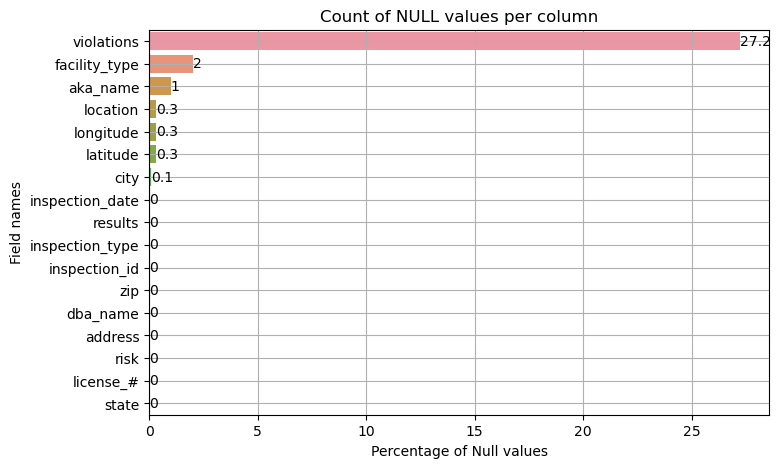

In [25]:
plt.figure(figsize=(8, 5))
ax = sns.barplot(data = cnt_data, y = cnt_data.index, x = 'null_counts')
ax.set(xlabel ="Percentage of Null values", ylabel = "Field names", title ='Count of NULL values per column')
ax.bar_label(ax.containers[0])
plt.grid()

Column 'violations' has highest number of NULL percentage (~30%)

In [26]:
# top 20 restaurants
top_10 = list(food_fltrd.aka_name.value_counts()[:20].index)

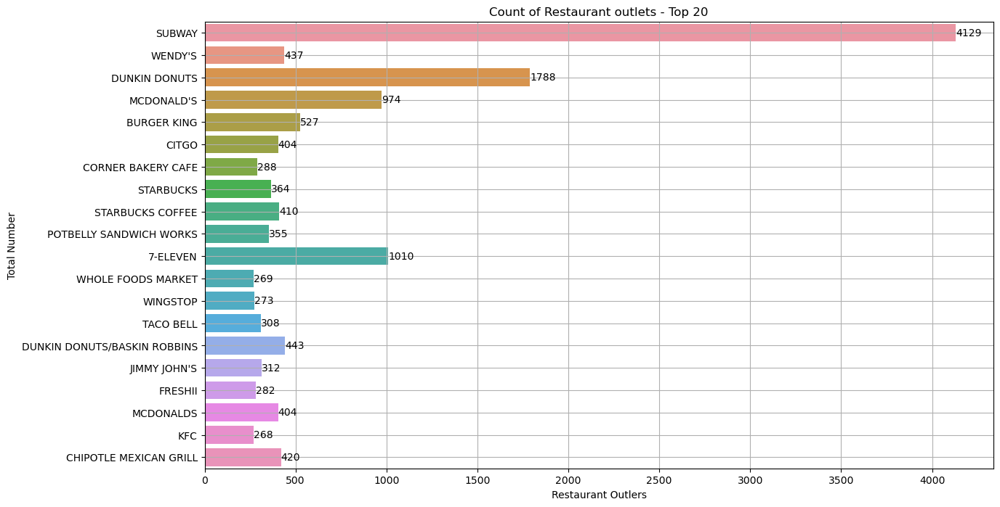

In [27]:
plt.figure(figsize=(14, 8))
plt_1 = sns.countplot(y = 'aka_name', data = food_fltrd[food_fltrd.aka_name.isin(top_10)], orient='v')
plt_1.bar_label(plt_1.containers[0])
plt_1.set(xlabel ="Restaurant Outlers", ylabel = "Total Number", title ='Count of Restaurant outlets - Top 20')
plt.grid()

Uh-oh! Few of the restaurant names are similar. Best way to handle is to merge them together.

In [28]:
food_fltrd.head(2)

,inspection_id,dba_name,aka_name,license_#,facility_type,risk,address,city,state,zip,inspection_date,inspection_type,results,violations,latitude,longitude,location
0,2571417,"M K POULTRY, INC.","M K POULTRY, INC.",1959029.0,Grocery Store,Risk 2 (Medium),2600 W 51ST ST,CHICAGO,IL,60632.0,2023-02-17,Complaint,Fail,"1. PERSON IN CHARGE PRESENT, DEMONSTRATES KNOW...",41.801181,-87.689185,"(41.801181282541556, -87.68918531154972)"
1,2571362,FIRST ACADEMY,FIRST ACADEMY,2501698.0,Children's Services Facility,Risk 1 (High),2523-2525 W PETERSON AVE,CHICAGO,IL,60659.0,2023-02-16,License,Pass,NaN,41.990367,-87.693163,"(41.99036720731882, -87.6931633926933)"


In [29]:
food_fltrd.facility_type.value_counts()

Restaurant                      167399
Grocery Store                    31528
School                           15632
Children's Services Facility      4968
Bakery                            3606
                                 ...  
MOBIL FOOD 1315                      1
GROCERY & RESTAURANT                 1
KIDS CAFE                            1
DRUG STORE/W/ FOOD                   1
NP-KIOSK                             1
Name: facility_type, Length: 510, dtype: int64

In [30]:
# top 20 facility types
facilty_20 = list(food_fltrd.facility_type.value_counts()[:20].index)

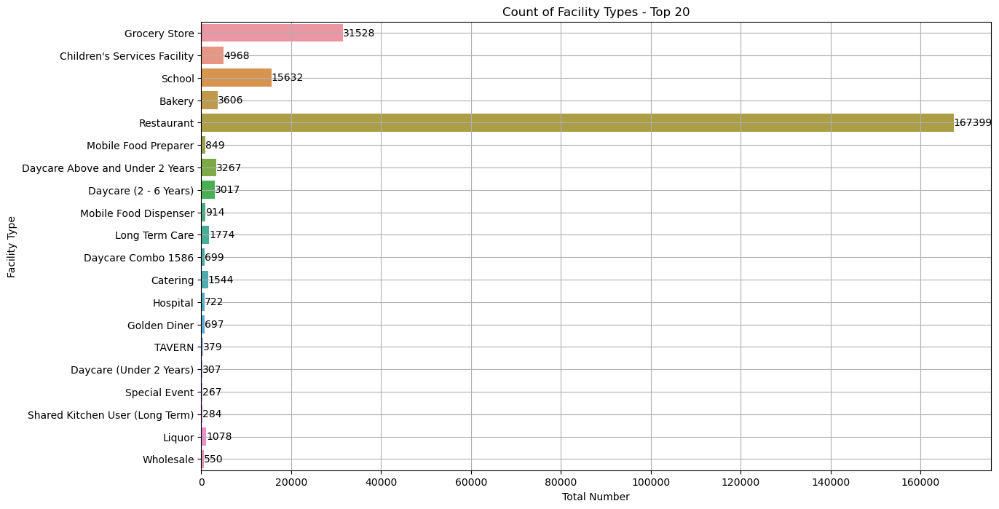

In [31]:
plt.figure(figsize = (14, 8))
ax = sns.countplot(y = 'facility_type', data = food_fltrd[food_fltrd.facility_type.isin(facilty_20)])
ax.bar_label(ax.containers[0])
ax.set(xlabel ="Total Number", ylabel = "Facility Type", title ='Count of Facility Types - Top 20')
plt.grid()

In [32]:
food_fltrd.risk.value_counts()

Risk 1 (High)      181164
Risk 2 (Medium)     47359
Risk 3 (Low)        20989
All                    53
Name: risk, dtype: int64

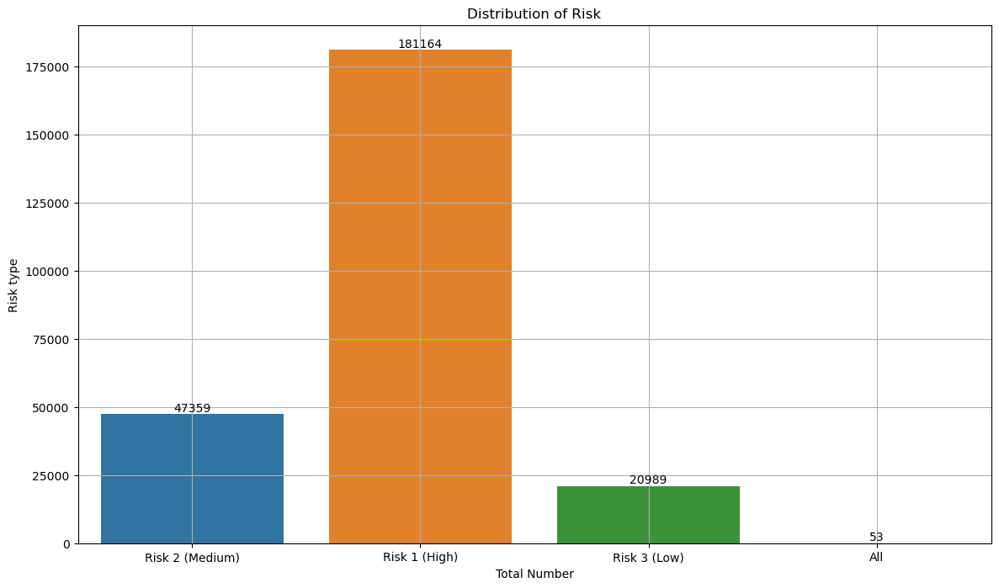

In [33]:
plt.figure(figsize = (14, 8))
ax = sns.countplot(x = 'risk', data = food_fltrd)
ax.bar_label(ax.containers[0])
ax.set(xlabel ="Total Number", ylabel = "Risk type", title ='Distribution of Risk')
plt.grid()

In [34]:
food_fltrd['city'] = np.where(food_fltrd.city.str.contains('CHICAGO|Chicago|chicago|CHicago', regex=True, na=False), 'CHICAGO', 
                             food_fltrd.city)

In [35]:
food_fltrd.city.value_counts()

CHICAGO              249246
SCHAUMBURG               27
EVANSTON                 16
MAYWOOD                  15
ELK GROVE VILLAGE        13
                      ...  
NEW YORK                  1
Maywood                   1
TORRANCE                  1
LOS ANGELES               1
WADSWORTH                 1
Name: city, Length: 64, dtype: int64

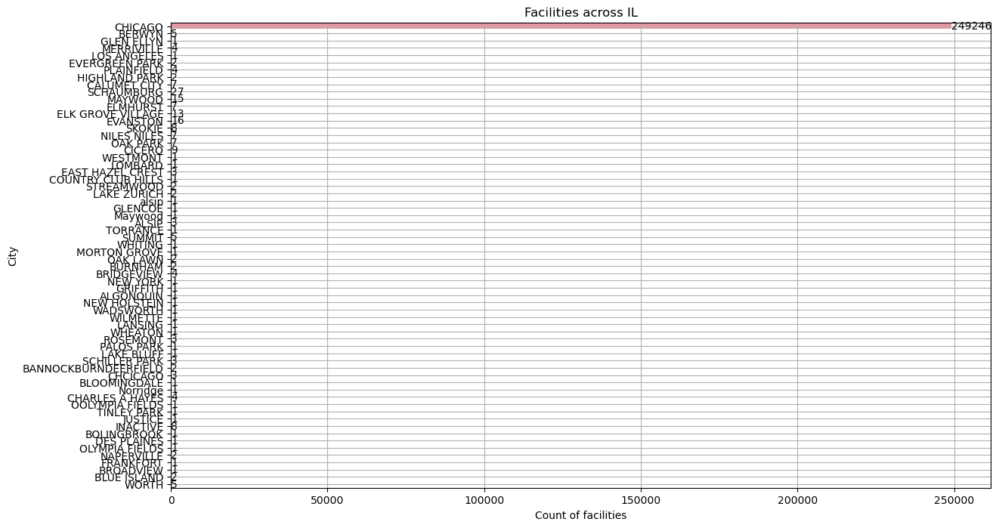

In [36]:
plt.figure(figsize = (14, 8))
ax = sns.countplot(y = 'city', data = food_fltrd)
ax.bar_label(ax.containers[0])
ax.set(xlabel ="Count of facilities", ylabel = "City", title ='Facilities across IL')
plt.grid()

In [37]:
# plt.figure(figsize=(20, 20))
# sns.pairplot(data = food_fltrd)

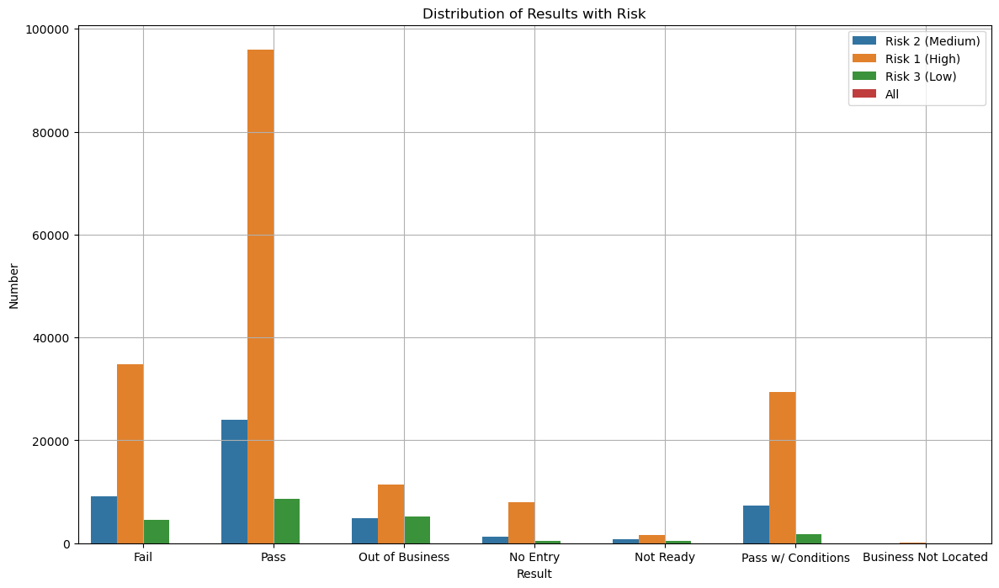

In [38]:
plt.figure(figsize = (14, 8))
ax = sns.countplot(x = 'results', data = food_fltrd, hue="risk")
# ax.bar_label(ax.containers[0])
ax.set(xlabel ="Result", ylabel = "Number", title ='Distribution of Results with Risk')
ax.legend(loc = "upper right")
plt.grid()

In [39]:
food_fltrd.head(2)

,inspection_id,dba_name,aka_name,license_#,facility_type,risk,address,city,state,zip,inspection_date,inspection_type,results,violations,latitude,longitude,location
0,2571417,"M K POULTRY, INC.","M K POULTRY, INC.",1959029.0,Grocery Store,Risk 2 (Medium),2600 W 51ST ST,CHICAGO,IL,60632.0,2023-02-17,Complaint,Fail,"1. PERSON IN CHARGE PRESENT, DEMONSTRATES KNOW...",41.801181,-87.689185,"(41.801181282541556, -87.68918531154972)"
1,2571362,FIRST ACADEMY,FIRST ACADEMY,2501698.0,Children's Services Facility,Risk 1 (High),2523-2525 W PETERSON AVE,CHICAGO,IL,60659.0,2023-02-16,License,Pass,NaN,41.990367,-87.693163,"(41.99036720731882, -87.6931633926933)"


In [40]:
food_fltrd.inspection_type.value_counts()

Canvass                  130590
License                   33284
Canvass Re-Inspection     27026
Complaint                 23477
License Re-Inspection     10843
                          ...  
CORRECTIVE ACTION             1
O.B.                          1
COVID COMPLAINT               1
Duplicated                    1
Business Not Located          1
Name: inspection_type, Length: 109, dtype: int64

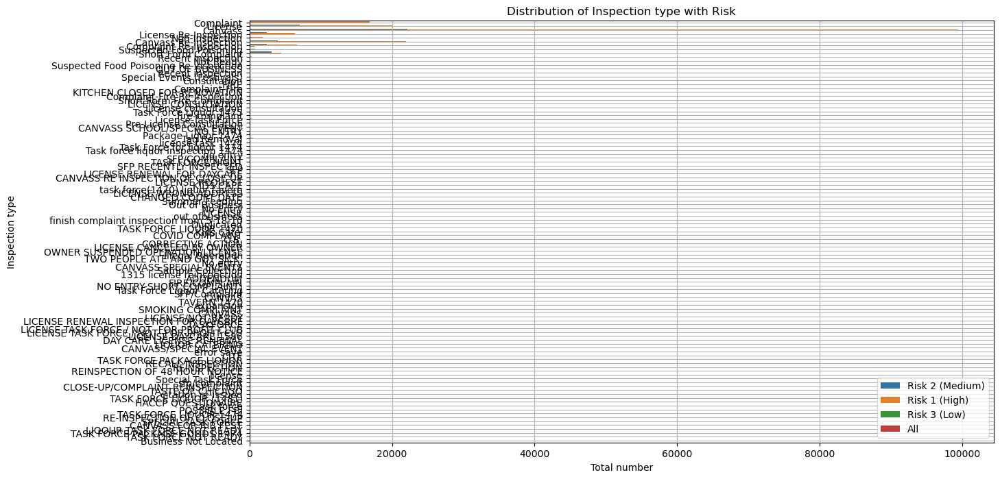

In [41]:
plt.figure(figsize=(14, 8))
ax = sns.countplot(y= "inspection_type", data = food_fltrd, hue = 'risk')
plt.grid()
ax.set(xlabel ="Total number", ylabel = "Inspection type", title ='Distribution of Inspection type with Risk')
ax.legend(loc='lower right')

#### Geographic viz

In [42]:
geo_df = food_fltrd.dropna(axis=0, subset=['latitude', 'longitude'])

In [43]:
import folium
from folium import plugins

In [44]:
map_attributions = ('&copy; <a href="http://www.openstreetmap.org/copyright">OpenStreetMap</a> '
        'contributors, &copy; <a href="http://cartodb.com/attributions">CartoDB</a>')

In [45]:
heatmap = folium.Map(location=[41.85, -87.68],
                         control_scale=True,
                     tiles='Cartodb Positron', 
                     attr = map_attributions,
                         zoom_start=10)

In [46]:
point_tuples = zip(geo_df.latitude, geo_df.longitude)

In [47]:
points = [[la, lo] for la, lo in point_tuples]

In [48]:
cluster = plugins.HeatMap(data=points,
                              name="heatmap", 
              gradient={.4: 'blue', .65: 'lime', 1: 'red'},
                              radius=10)

In [49]:
heatmap.add_children(cluster)

# bi-variate analysis

In [50]:
food_fltrd.head()

,inspection_id,dba_name,aka_name,license_#,facility_type,risk,address,city,state,zip,inspection_date,inspection_type,results,violations,latitude,longitude,location
0,2571417,"M K POULTRY, INC.","M K POULTRY, INC.",1959029.0,Grocery Store,Risk 2 (Medium),2600 W 51ST ST,CHICAGO,IL,60632.0,2023-02-17,Complaint,Fail,"1. PERSON IN CHARGE PRESENT, DEMONSTRATES KNOW...",41.801181,-87.689185,"(41.801181282541556, -87.68918531154972)"
1,2571362,FIRST ACADEMY,FIRST ACADEMY,2501698.0,Children's Services Facility,Risk 1 (High),2523-2525 W PETERSON AVE,CHICAGO,IL,60659.0,2023-02-16,License,Pass,NaN,41.990367,-87.693163,"(41.99036720731882, -87.6931633926933)"
2,2571314,Northwest Middle/Belmont-Cragin,Northwest Middle School,41121.0,School,Risk 1 (High),5252 W Palmer,CHICAGO,IL,60639.0,2023-02-16,Canvass,Pass,NaN,41.920538,-87.758200,"(41.920538446762095, -87.75820002999474)"
3,2571261,SALT SHED,SALT SHED,2877078.0,MUSIC VENUE,Risk 3 (Low),1357 N ELSTON AVE,CHICAGO,IL,60642.0,2023-02-15,License Re-Inspection,Pass,"38. INSECTS, RODENTS, & ANIMALS NOT PRESENT - ...",41.907049,-87.659765,"(41.90704947171354, -87.6597649708448)"
4,2571260,M & A BAKERY,M BAKERY,1382540.0,Bakery,Risk 1 (High),1527 W LAWRENCE AVE,CHICAGO,IL,60640.0,2023-02-15,Canvass,Out of Business,NaN,41.968773,-87.668624,"(41.96877279428135, -87.6686244081723)"


In [51]:
food_fltrd['year'] = (food_fltrd.inspection_date.dt.year)
food_fltrd['month'] = (food_fltrd.inspection_date.dt.month)

In [52]:
food_fltrd['YRMO'] = food_fltrd['year'].astype(str) + '-' + food_fltrd.month.astype(str)

In [53]:
cnt_plt_df = food_fltrd.groupby(['inspection_date']).size().reset_index()

In [54]:
cnt_plt_df

,inspection_date,0
0,2010-01-04,7
1,2010-01-05,71
2,2010-01-06,81
3,2010-01-07,62
4,2010-01-08,43
...,...,...
3313,2023-02-10,58
3314,2023-02-14,71
3315,2023-02-15,30
3316,2023-02-16,38


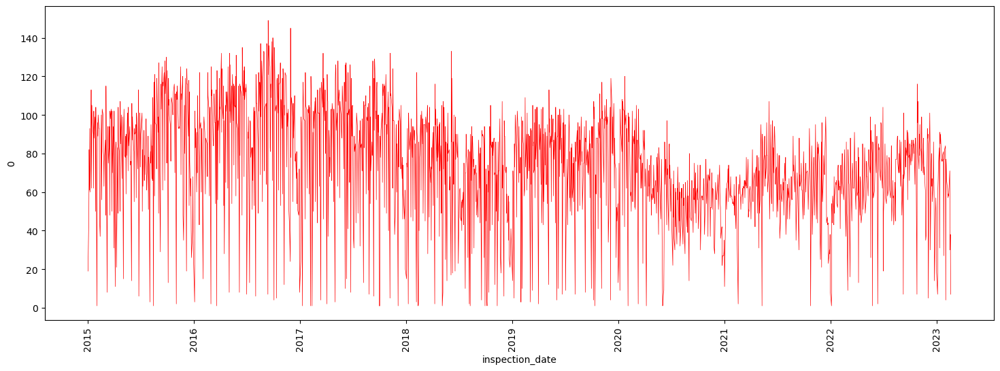

In [55]:
plt.figure(figsize=(18, 6))
ax = sns.lineplot(data=cnt_plt_df[cnt_plt_df.inspection_date>'2015-01-01'],
                       #x=df['date'],
                       x='inspection_date',
                       y=0,
                       color='red',
                       linewidth=.5
                       #hue=hue
                 )
                  
ax.tick_params(axis='x', rotation=90)

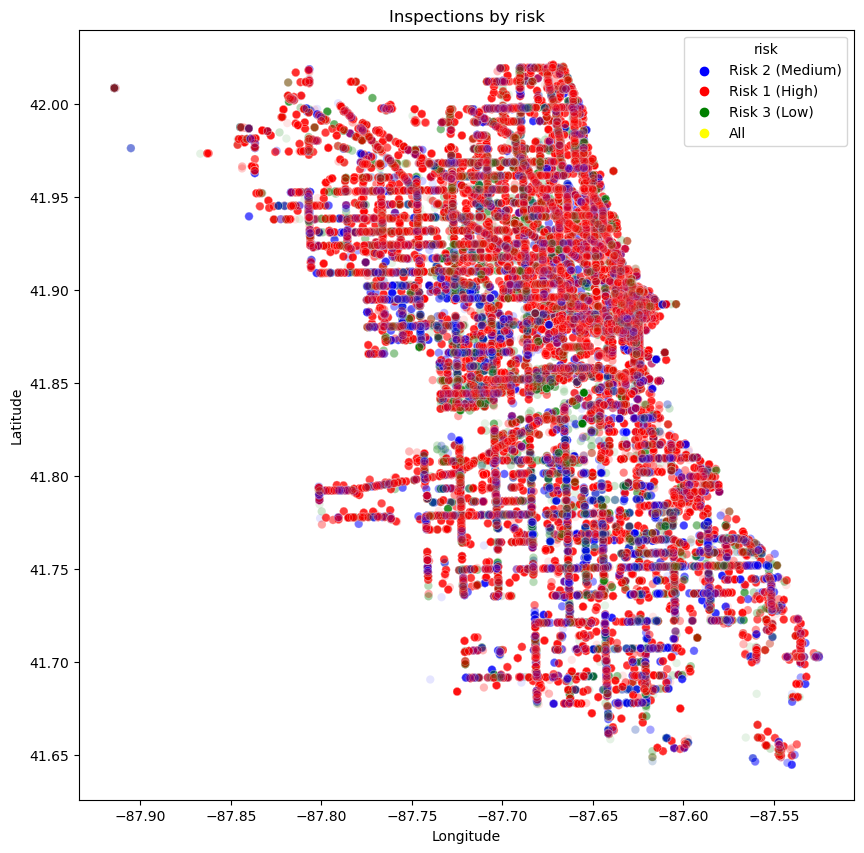

In [56]:
fig, ax = plt.subplots(figsize=(10,10))
sns.scatterplot(x='longitude', y='latitude', hue='risk' , data=food_fltrd,
                ax=ax,alpha=0.1, palette = ["blue","red","green", "yellow"])
ax.set_title("Inspections by risk")
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

In [57]:
food_fltrd.risk.value_counts()

Risk 1 (High)      181164
Risk 2 (Medium)     47359
Risk 3 (Low)        20989
All                    53
Name: risk, dtype: int64

In [58]:
food_fltrd.risk.unique()

array(['Risk 2 (Medium)', 'Risk 1 (High)', 'Risk 3 (Low)', 'All', nan],
      dtype=object)

In [59]:
folium.Marker()

In [60]:
food_fltrd.dropna(subset=['latitude', 'longitude', 'risk'], inplace=True)

In [61]:
heatmap = folium.Map(location=[41.85, -87.68],
                         control_scale=True,
                     tiles='Cartodb Positron', 
                     attr = map_attributions,
                         zoom_start=10)

In [62]:
colors = {"Risk 1 (High)" : 'red', 'Risk 2 (Medium)' : 'blue', 'Risk 3 (Low)' : 'yellow', 'All':'grey'}
food_fltrd.apply(lambda row:folium.CircleMarker(location=[row["latitude"], row["longitude"]], 
                                              radius=.01, fill_color=colors[row['risk']])
                                             .add_to(heatmap), axis=1)

0         <folium.vector_layers.CircleMarker object at 0...
1         <folium.vector_layers.CircleMarker object at 0...
2         <folium.vector_layers.CircleMarker object at 0...
3         <folium.vector_layers.CircleMarker object at 0...
4         <folium.vector_layers.CircleMarker object at 0...
                                ...                        
249635    <folium.vector_layers.CircleMarker object at 0...
249636    <folium.vector_layers.CircleMarker object at 0...
249637    <folium.vector_layers.CircleMarker object at 0...
249638    <folium.vector_layers.CircleMarker object at 0...
249639    <folium.vector_layers.CircleMarker object at 0...
Length: 248708, dtype: object

In [68]:
food_fltrd.dropna(subset=['aka_name'], inplace=True)

In [69]:
food_fltrd.aka_name.value_counts()

SUBWAY                         4129
DUNKIN DONUTS                  1763
7-ELEVEN                       1010
MCDONALD'S                      974
BURGER KING                     527
                               ... 
ESTARBIEN CLUB DE NUTRICION       1
ROSA MARIANO                      1
Celestial Kitchens Inc.           1
MINI MARKET LUZ Y FUEGO           1
JACKSON OTB                       1
Name: aka_name, Length: 29379, dtype: int64

In [70]:
dunkin = food_fltrd[food_fltrd.aka_name.str.contains("DUNKIN")]['aka_name'].unique().tolist()

In [71]:
subway = food_fltrd[food_fltrd.aka_name.str.contains("SUBWAY")]['aka_name'].unique().tolist()

In [72]:
mc_donld = food_fltrd[food_fltrd.aka_name.str.contains("DONALD")]['aka_name'].unique().tolist()

In [73]:
mc_donld

['MCDONALDS (T1-B11)',
 "MCDONALD'S",
 'MC DONALDS',
 "McDONALD'S",
 "MC DONALD'S",
 'MCDONALDS',
 'MCDONALDS  (T3  K9)',
 'MCDONALDS #27672',
 "HALE FAMILY MCDONALD'S",
 "MCDONALD'S #26364",
 'MCDONALD?S',
 'MCDONALDS #4655',
 'OFFICER DONALD MARQUEZ CHARTER SCHOOL',
 "MCDONALD'S #490",
 'MCDONALD?S 28128',
 "McDONALD'S  (T2  E/F)",
 "MCDONALD'S #20104",
 "MCDONALD'S #5813",
 'Mc DONALDS',
 "McDONALD'S STORE #4061",
 'DONALDS FAMOUS HOT DOGS',
 'McDONALDS (T1 C10)',
 'McDONALDS',
 "MCDONALD'S   (T3- L4)",
 'OFFICER DONALD MARQUEZ',
 'MCDONALDS #12003',
 "MCDONALD'S EXPRESS",
 "MCDONALD'S RESTAURANTS",
 "MCDONALD'S #6310",
 'MCDONALDS #7069',
 'Mc DONALDS # 6771',
 'MCDONALDS RESTAURANT',
 "MCDONALD'S RESTAURANT",
 "MCDONALD'S CORPORATION",
 "MCDONALD'S  (T3 HK FOOD COURT)",
 "MCDONALD'S #11290",
 "MC DONALD' S  # 6888",
 'MC DONALDS RESTAURANT',
 "MCDONALD'S (T3 H9)",
 'SARAH MCDONALD STEELE',
 'MCDONALDS #7463',
 "DONALD'S HOT DOG",
 "MCDONALD'S (T5/ARRIVAL)",
 'MC DONALDS-MCCORMICK 

In [74]:
BAD = ['OFFICER DONALD MARQUEZ', 'OFFICER DONALD MARQUEZ CHARTER SCHOOL', 'DONALDS FAMOUS HOT DOGS']
[mc_donld.remove(x) for x in BAD]

[None, None, None]

In [75]:
food_fltrd['food_chain'] = np.where(food_fltrd.aka_name.isin(mc_donld), 'MCDONALDs',
                                    np.where(food_fltrd.aka_name.isin(subway), 'SUBWAY',
                                             np.where(food_fltrd.aka_name.isin(dunkin), "DUNKIN_DONUTS", None)))

In [76]:
cnt_plt_df = food_fltrd.groupby(['year', 'food_chain', 'risk']).size().reset_index()

In [77]:
cnt_plt_df[cnt_plt_df.food_chain.isna()]

,year,food_chain,risk,0


In [78]:
cnt_plt_df.rename({0:'count'}, axis = 1, inplace=True)

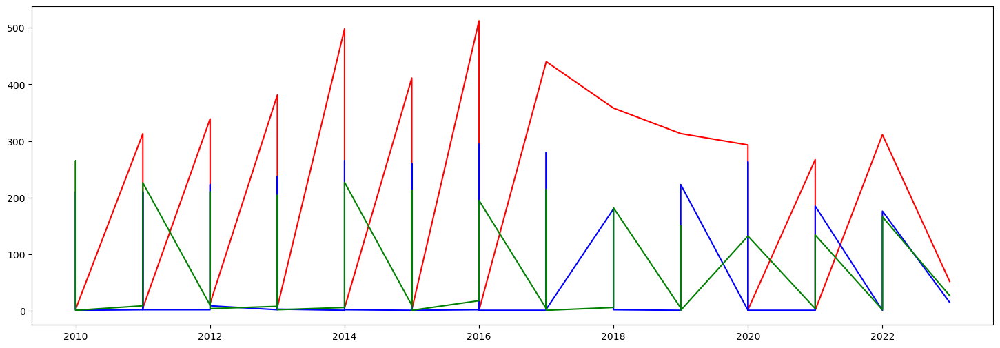

In [79]:
plt.figure(figsize=(18, 6))
plt.plot(cnt_plt_df[cnt_plt_df.food_chain=='SUBWAY']['year'],
         cnt_plt_df[cnt_plt_df.food_chain=='SUBWAY']['count'], label = "SUBWAY", color = 'red')

plt.plot(cnt_plt_df[cnt_plt_df.food_chain=='DUNKIN_DONUTS']['year'],
         cnt_plt_df[cnt_plt_df.food_chain=='DUNKIN_DONUTS']['count'], label = "DUNKIN_DONUTS", color = 'blue')

plt.plot(cnt_plt_df[cnt_plt_df.food_chain=='MCDONALDs']['year'],
         cnt_plt_df[cnt_plt_df.food_chain=='MCDONALDs']['count'], label = "MCDONALD's", color = 'green')

<AxesSubplot:xlabel='year', ylabel='count'>

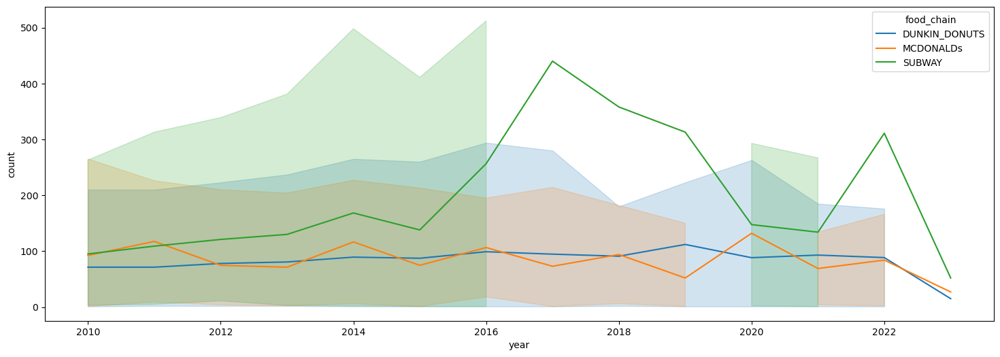

In [80]:
plt.figure(figsize=(18, 6))
sns.lineplot(
                       x='year',
                       y='count',
    data=cnt_plt_df,
#                        linewidth=2,
                       hue='food_chain')

In [81]:
# We count the number pf inspections by type and year
year_inspection_type = pd.DataFrame(food_fltrd.groupby(['year','inspection_type'])['inspection_id'].count()).reset_index()

In [82]:
year_inspection_type

,year,inspection_type,inspection_id
0,2010,Business Not Located,1
1,2010,CANVASS,1
2,2010,CANVASS FOR RIB FEST,1
3,2010,CANVASS RE INSPECTION OF CLOSE UP,1
4,2010,CANVASS/SPECIAL EVENT,1
...,...,...,...
296,2023,Non-Inspection,127
297,2023,Recent Inspection,1
298,2023,Short Form Complaint,8
299,2023,Suspected Food Poisoning,3


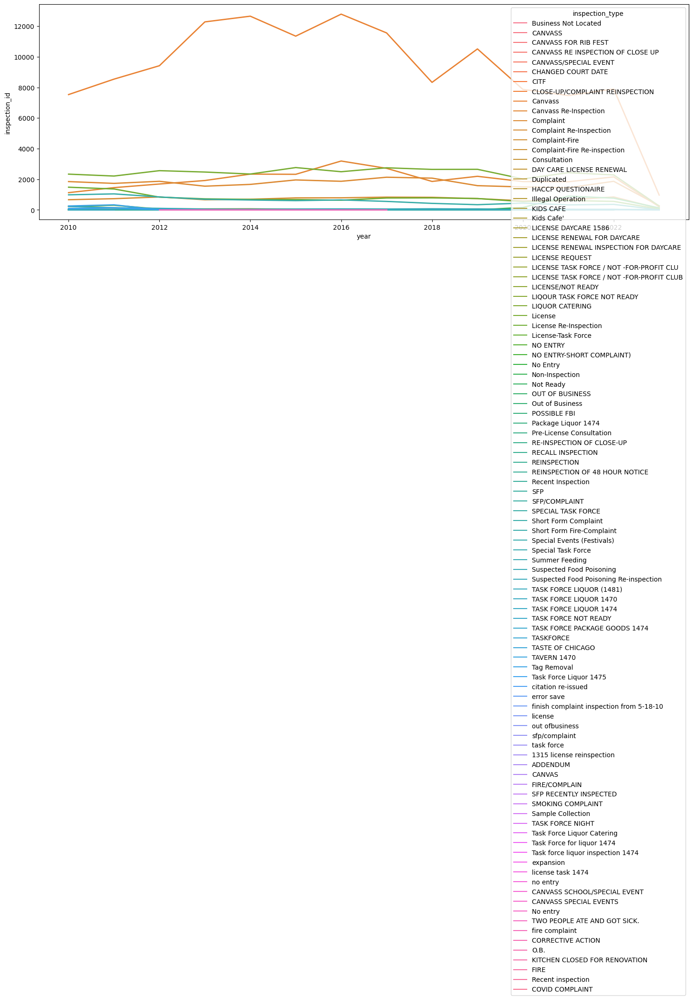

In [83]:
plt.figure(figsize=(18, 6))
ax = sns.lineplot(data=year_inspection_type,
                       #x=df['date'],
                       x='year',
                       y='inspection_id',
                       linewidth=2,
                       hue='inspection_type'
                 )
                  
ax.tick_params(axis='x')

In [84]:
year_inspection_type = year_inspection_type.pivot(index='year', values='inspection_id', columns='inspection_type')

year_inspection_type.fillna(0, inplace=True)

year_inspection_type.head()

inspection_type,1315 license reinspection,ADDENDUM,Business Not Located,CANVAS,CANVASS,CANVASS FOR RIB FEST,CANVASS RE INSPECTION OF CLOSE UP,CANVASS SCHOOL/SPECIAL EVENT,CANVASS SPECIAL EVENTS,CANVASS/SPECIAL EVENT,CHANGED COURT DATE,CITF,CLOSE-UP/COMPLAINT REINSPECTION,CORRECTIVE ACTION,COVID COMPLAINT,Canvass,Canvass Re-Inspection,Complaint,Complaint Re-Inspection,Complaint-Fire,Complaint-Fire Re-inspection,Consultation,DAY CARE LICENSE RENEWAL,Duplicated,FIRE,FIRE/COMPLAIN,HACCP QUESTIONAIRE,Illegal Operation,KIDS CAFE,KITCHEN CLOSED FOR RENOVATION,Kids Cafe',LICENSE DAYCARE 1586,LICENSE RENEWAL FOR DAYCARE,LICENSE RENEWAL INSPECTION FOR DAYCARE,LICENSE REQUEST,LICENSE TASK FORCE / NOT -FOR-PROFIT CLU,LICENSE TASK FORCE / NOT -FOR-PROFIT CLUB,LICENSE/NOT READY,LIQOUR TASK FORCE NOT READY,LIQUOR CATERING,License,License Re-Inspection,License-Task Force,NO ENTRY,NO ENTRY-SHORT COMPLAINT),No Entry,No entry,Non-Inspection,Not Ready,O.B.,OUT OF BUSINESS,Out of Business,POSSIBLE FBI,Package Liquor 1474,Pre-License Consultation,RE-INSPECTION OF CLOSE-UP,RECALL INSPECTION,REINSPECTION,REINSPECTION OF 48 HOUR NOTICE,Recent Inspection,Recent inspection,SFP,SFP RECENTLY INSPECTED,SFP/COMPLAINT,SMOKING COMPLAINT,SPECIAL TASK FORCE,Sample Collection,Short Form Complaint,Short Form Fire-Complaint,Special Events (Festivals),Special Task Force,Summer Feeding,Suspected Food Poisoning,Suspected Food Poisoning Re-inspection,TASK FORCE LIQUOR (1481),TASK FORCE LIQUOR 1470,TASK FORCE LIQUOR 1474,TASK FORCE NIGHT,TASK FORCE NOT READY,TASK FORCE PACKAGE GOODS 1474,TASKFORCE,TASTE OF CHICAGO,TAVERN 1470,TWO PEOPLE ATE AND GOT SICK.,Tag Removal,Task Force Liquor 1475,Task Force Liquor Catering,Task Force for liquor 1474,Task force liquor inspection 1474,citation re-issued,error save,expansion,finish complaint inspection from 5-18-10,fire complaint,license,license task 1474,no entry,out ofbusiness,sfp/complaint,task force
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2010,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,7533.0,1126.0,1848.0,664.0,59.0,14.0,225.0,1.0,1.0,0.0,0.0,1.0,2.0,1.0,0.0,1.0,1.0,2.0,1.0,19.0,1.0,1.0,2.0,1.0,1.0,2335.0,1481.0,231.0,4.0,1.0,60.0,0.0,5.0,5.0,0.0,16.0,279.0,1.0,20.0,1.0,1.0,1.0,2.0,2.0,20.0,0.0,3.0,0.0,3.0,0.0,2.0,0.0,984.0,17.0,34.0,1.0,1.0,224.0,35.0,1.0,1.0,2.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,254.0,89.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,2.0
2011,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8542.0,1453.0,1731.0,731.0,44.0,10.0,136.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2211.0,1366.0,304.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,15.0,6.0,0.0,0.0,0.0,0.0,20.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1045.0,42.0,11.0,0.0,0.0,141.0,32.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,330.0,135.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,0.0,0.0,0.0
2012,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,9419.0,1690.0,1867.0,843.0,43.0,14.0,73.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2562.0,833.0,51.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,4.0,0.0,0.0,5.0,4.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,844.0,31.0,5.0,0.0,0.0,100.0,22.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,6.0,21.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2013,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,12282.0,1918.0,1548.0,661.0,11.0,2.0,64.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2472.0,722.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,691.0,21.0,3.0,0.0,0.0,52.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2014,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12655.0,2337.0,1665.0,693.0,2.0,0.0,71.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2342.0,682.0,2.0,0.0,0.0,0.0,0.0,1

In [85]:
food_fltrd.inspection_type.value_counts()

Canvass                       129187
License                        32213
Canvass Re-Inspection          26848
Complaint                      23349
License Re-Inspection          10447
                               ...  
NO ENTRY-SHORT COMPLAINT)          1
Task Force Liquor Catering         1
CANVAS                             1
TAVERN 1470                        1
Business Not Located               1
Name: inspection_type, Length: 100, dtype: int64

In [86]:
year_inspection_type.columns

Index(['1315 license reinspection', 'ADDENDUM', 'Business Not Located',
       'CANVAS', 'CANVASS', 'CANVASS FOR RIB FEST',
       'CANVASS RE INSPECTION OF CLOSE UP', 'CANVASS SCHOOL/SPECIAL EVENT',
       'CANVASS SPECIAL EVENTS', 'CANVASS/SPECIAL EVENT', 'CHANGED COURT DATE',
       'CITF', 'CLOSE-UP/COMPLAINT REINSPECTION', 'CORRECTIVE ACTION',
       'COVID COMPLAINT', 'Canvass', 'Canvass Re-Inspection', 'Complaint',
       'Complaint Re-Inspection', 'Complaint-Fire',
       'Complaint-Fire Re-inspection', 'Consultation',
       'DAY CARE LICENSE RENEWAL', 'Duplicated', 'FIRE', 'FIRE/COMPLAIN',
       'HACCP QUESTIONAIRE', 'Illegal Operation', 'KIDS CAFE',
       'KITCHEN CLOSED FOR RENOVATION', 'Kids Cafe'', 'LICENSE DAYCARE 1586',
       'LICENSE RENEWAL FOR DAYCARE', 'LICENSE RENEWAL INSPECTION FOR DAYCARE',
       'LICENSE REQUEST', 'LICENSE TASK FORCE / NOT -FOR-PROFIT CLU',
       'LICENSE TASK FORCE / NOT -FOR-PROFIT CLUB', 'LICENSE/NOT READY',
       'LIQOUR TASK FORCE NOT

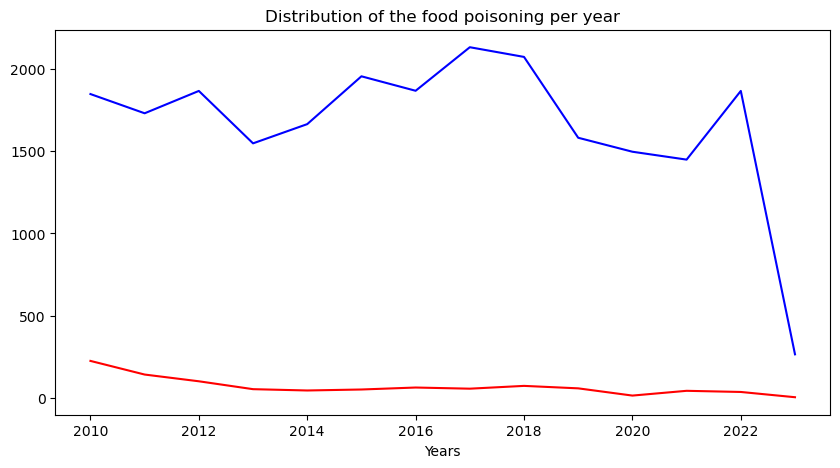

In [87]:
year_inspection_type['Suspected Food Poisoning'].plot(figsize=(10,5), label='food_poisoning', color = 'red')
year_inspection_type['Complaint'].plot(figsize=(10,5), label='Complaint', color = 'blue')

plt.title("Distribution of the food poisoning per year")
plt.xlabel("Years")
plt.show()

In [88]:
food_fltrd.head()

,inspection_id,dba_name,aka_name,license_#,facility_type,risk,address,city,state,zip,inspection_date,inspection_type,results,violations,latitude,longitude,location,year,month,YRMO,food_chain
0,2571417,"M K POULTRY, INC.","M K POULTRY, INC.",1959029.0,Grocery Store,Risk 2 (Medium),2600 W 51ST ST,CHICAGO,IL,60632.0,2023-02-17,Complaint,Fail,"1. PERSON IN CHARGE PRESENT, DEMONSTRATES KNOW...",41.801181,-87.689185,"(41.801181282541556, -87.68918531154972)",2023,2,2023-2,None
1,2571362,FIRST ACADEMY,FIRST ACADEMY,2501698.0,Children's Services Facility,Risk 1 (High),2523-2525 W PETERSON AVE,CHICAGO,IL,60659.0,2023-02-16,License,Pass,NaN,41.990367,-87.693163,"(41.99036720731882, -87.6931633926933)",2023,2,2023-2,None
2,2571314,Northwest Middle/Belmont-Cragin,Northwest Middle School,41121.0,School,Risk 1 (High),5252 W Palmer,CHICAGO,IL,60639.0,2023-02-16,Canvass,Pass,NaN,41.920538,-87.758200,"(41.920538446762095, -87.75820002999474)",2023,2,2023-2,None
3,2571261,SALT SHED,SALT SHED,2877078.0,MUSIC VENUE,Risk 3 (Low),1357 N ELSTON AVE,CHICAGO,IL,60642.0,2023-02-15,License Re-Inspection,Pass,"38. INSECTS, RODENTS, & ANIMALS NOT PRESENT - ...",41.907049,-87.659765,"(41.90704947171354, -87.6597649708448)",2023,2,2023-2,None
4,2571260,M & A BAKERY,M BAKERY,1382540.0,Bakery,Risk 1 (High),1527 W LAWRENCE AVE,CHICAGO,IL,60640.0,2023-02-15,Canvass,Out of Business,NaN,41.968773,-87.668624,"(41.96877279428135, -87.6686244081723)",2023,2,2023-2,None


In [89]:
food_fltrd.results.unique()

array(['Fail', 'Pass', 'Out of Business', 'No Entry', 'Not Ready',
       'Pass w/ Conditions', 'Business Not Located'], dtype=object)

In [90]:
food_fltrd = food_fltrd[food_fltrd.results.isin(['Pass', 'Fail', 'Pass w/ Conditions'])]

### distribution of food poisoning by year

In [91]:
new_cnt_df = food_fltrd.groupby(['year', 'results', 'inspection_type']).size().reset_index().rename({0:'count'}, axis=1)

Text(0.5, 1.0, 'Distribution of results of food poisoning inspection per year')

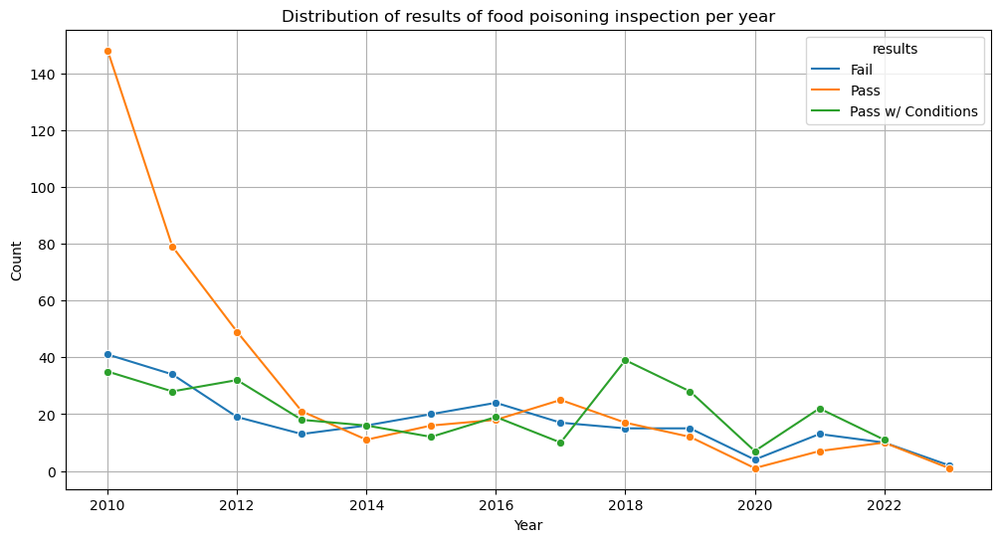

In [92]:
plt.figure(figsize=(12, 6))
sns.lineplot(
                       x='year',
                       y='count',
    data=new_cnt_df[new_cnt_df.inspection_type=='Suspected Food Poisoning'],
#                        linewidth=2,
                       hue='results', marker="o")
plt.grid()
plt.xlabel("Year")
plt.ylabel("Count")
plt.title("Distribution of results of food poisoning inspection per year")

In [93]:
new_cnt_df = food_fltrd.groupby(['year', 'food_chain']).size().reset_index().rename({0:'count'}, axis=1)

In [94]:
new_cnt_df

,year,food_chain,count
0,2010,DUNKIN_DONUTS,211
1,2010,MCDONALDs,275
2,2010,SUBWAY,276
3,2011,DUNKIN_DONUTS,212
4,2011,MCDONALDs,230
5,2011,SUBWAY,315
6,2012,DUNKIN_DONUTS,218
7,2012,MCDONALDs,214
8,2012,SUBWAY,314
9,2013,DUNKIN_DONUTS,230


Text(0.5, 1.0, 'Inspections conducted in Food Chains per year')

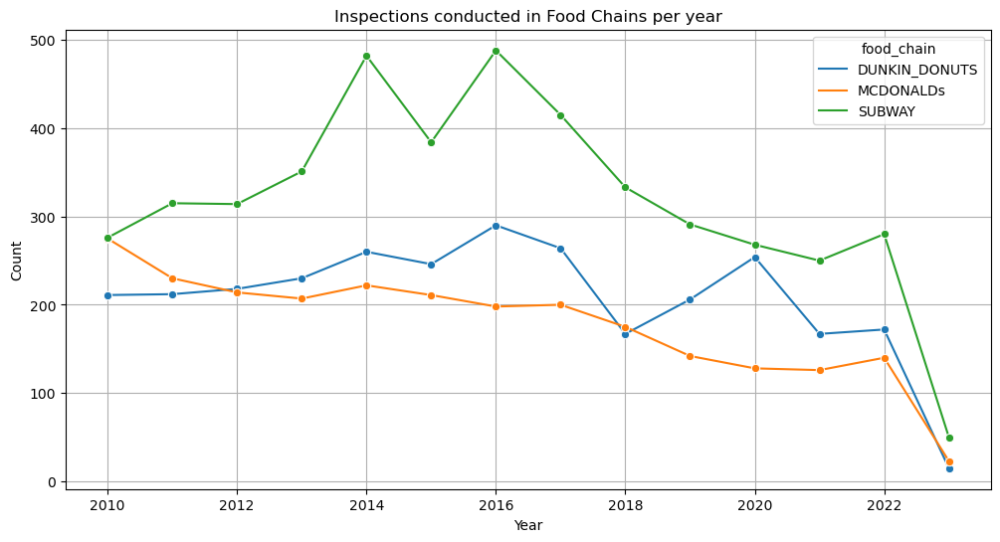

In [95]:
plt.figure(figsize=(12, 6))
sns.lineplot(
                       x='year',
                       y='count',
    data=new_cnt_df,
#                        linewidth=2,
                       hue='food_chain', marker="o")
plt.grid()
plt.xlabel("Year")
plt.ylabel("Count")
plt.title("Inspections conducted in Food Chains per year")

In [96]:
food_fltrd.head()

,inspection_id,dba_name,aka_name,license_#,facility_type,risk,address,city,state,zip,inspection_date,inspection_type,results,violations,latitude,longitude,location,year,month,YRMO,food_chain
0,2571417,"M K POULTRY, INC.","M K POULTRY, INC.",1959029.0,Grocery Store,Risk 2 (Medium),2600 W 51ST ST,CHICAGO,IL,60632.0,2023-02-17,Complaint,Fail,"1. PERSON IN CHARGE PRESENT, DEMONSTRATES KNOW...",41.801181,-87.689185,"(41.801181282541556, -87.68918531154972)",2023,2,2023-2,None
1,2571362,FIRST ACADEMY,FIRST ACADEMY,2501698.0,Children's Services Facility,Risk 1 (High),2523-2525 W PETERSON AVE,CHICAGO,IL,60659.0,2023-02-16,License,Pass,NaN,41.990367,-87.693163,"(41.99036720731882, -87.6931633926933)",2023,2,2023-2,None
2,2571314,Northwest Middle/Belmont-Cragin,Northwest Middle School,41121.0,School,Risk 1 (High),5252 W Palmer,CHICAGO,IL,60639.0,2023-02-16,Canvass,Pass,NaN,41.920538,-87.758200,"(41.920538446762095, -87.75820002999474)",2023,2,2023-2,None
3,2571261,SALT SHED,SALT SHED,2877078.0,MUSIC VENUE,Risk 3 (Low),1357 N ELSTON AVE,CHICAGO,IL,60642.0,2023-02-15,License Re-Inspection,Pass,"38. INSECTS, RODENTS, & ANIMALS NOT PRESENT - ...",41.907049,-87.659765,"(41.90704947171354, -87.6597649708448)",2023,2,2023-2,None
5,2571196,LA MICHOACANA ICE CREAM SHOP,LA MICHOACANA ICE CREAM SHOP,2698396.0,Restaurant,Risk 1 (High),3591-3597 N MILWAUKEE AVE,CHICAGO,IL,60641.0,2023-02-14,Canvass,Fail,"38. INSECTS, RODENTS, & ANIMALS NOT PRESENT - ...",41.946140,-87.735183,"(41.94614005344282, -87.73518301995274)",2023,2,2023-2,None


In [97]:
food_fltrd.violations.unique()

array(['1. PERSON IN CHARGE PRESENT, DEMONSTRATES KNOWLEDGE, AND PERFORMS DUTIES - Comments: PERSON IN CHARGE WITHOUT CITY OF CHICAGO CERTIFIED MANAGER CERTIFICATE. INSTD TO OBTAIN AND  MAINTAIN SAME | 2. CITY OF CHICAGO FOOD SERVICE SANITATION CERTIFICATE - Comments: NO CITY OF CHICAGO CERTIFIED MANAGER ON DUTY WHILE HANDLING TCS FOODS (CHICKEN), NOR CERTIFICATE POSTED. INSTD TO CORRECT AND MAINTAIN ON SITE AT ALL TIMES. CITATION ISSUED PRIORITY FOUNDATION 7-38-012 | 5. PROCEDURES FOR RESPONDING TO VOMITING AND DIARRHEAL EVENTS - Comments: NO PROCEDURE OR SUPPLIES IN PLACE FOR RESPONDING TO VOMITING AND DIARRHEAL EVENTS. INSTD TO PROVIDE PROCEDURE AND NECESSARY SUPPLIES EFFECTED AGAINST NOROVIRUS  AND MAINTAIN ON SITE. CITATION ISSUED. PRIORITY FOUNDATION 7-38-005 | 10. ADEQUATE HANDWASHING SINKS PROPERLY SUPPLIED AND ACCESSIBLE - Comments: NO HANDWASH CLEANSER (SOAP)  AT HANDWASH SINK IN  EMPLOYEE TOILET ROOM. INSTD TO PROVIDE AND MAINTAIN HANDWASH CLEANSER AT ALL TIMES. PRIORITY FOU